Empezamos nuestro EDA importando las librerías que vamos a utilizar. 

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from  matplotlib import pyplot as plt
import seaborn as sns
import missingno as msno

 Ruta del fichero: 
 Cargamos los datos 

Escribimos la ruta del fichero. Además cambiamos la variable release_date de tipo object a date time para poder trabajar con ellas y hacemos un head para ver las 5 primeras filas.

In [3]:
#Cargamos los datos
#ruta del fichero
#df_tracks = pd.read_csv("Ruta_fichero")

df_Smarta = pd.read_csv(r"C:\Users\mareg\OneDrive\Documentos\TheBridge_Enero\Data_Analyst\test\SPOTIFY\nuevo_DFSpotify.csv", encoding = "UTF-8",parse_dates=['release_date'])
df_Smarta.head()



,id,name_x,popularity,duration_ms,explicit_x,artists_x,id_artists,release_date,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,country,artist_genres
0,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,1,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'..."
1,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,1,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'..."
2,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,1,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'..."
3,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,1,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'..."
4,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,1,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'..."


Vistazo a las diferentes columnas y tipo de variables 

In [4]:
df_Smarta.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3248254 entries, 0 to 3248253
Data columns (total 22 columns):
 #   Column            Dtype         
---  ------            -----         
 0   id                object        
 1   name_x            object        
 2   popularity        int64         
 3   duration_ms       int64         
 4   explicit_x        int64         
 5   artists_x         object        
 6   id_artists        object        
 7   release_date      datetime64[ns]
 8   danceability      float64       
 9   energy            float64       
 10  key               int64         
 11  loudness          float64       
 12  mode              int64         
 13  speechiness       float64       
 14  acousticness      float64       
 15  instrumentalness  float64       
 16  liveness          float64       
 17  valence           float64       
 18  tempo             float64       
 19  time_signature    int64         
 20  country           object        
 21  artist_g

Miramos el numero de valores nulos por cada columna 
(En este dataset hay nulos en los nombres de las canciones)

In [5]:
df_Smarta.isnull().sum()

id                  0
name_x              0
popularity          0
duration_ms         0
explicit_x          0
artists_x           0
id_artists          0
release_date        0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
country             0
artist_genres       0
dtype: int64

He decidido no eliminar las filas que no tienen nombre porque son casi todas del mismo artista y es conocido (Louis Armstrong), puede que sean melódicas? pero dejo la formula por si es necesaria posteriormente 

In [ ]:
# Dropping rows where name is null
#df_tracks_data.dropna(subset=['name'], axis=0, inplace=True) 

Analizamos el número de nulos pero de un modo más visual a través de una muestra de 25000 filas aleatorias 

<AxesSubplot:>

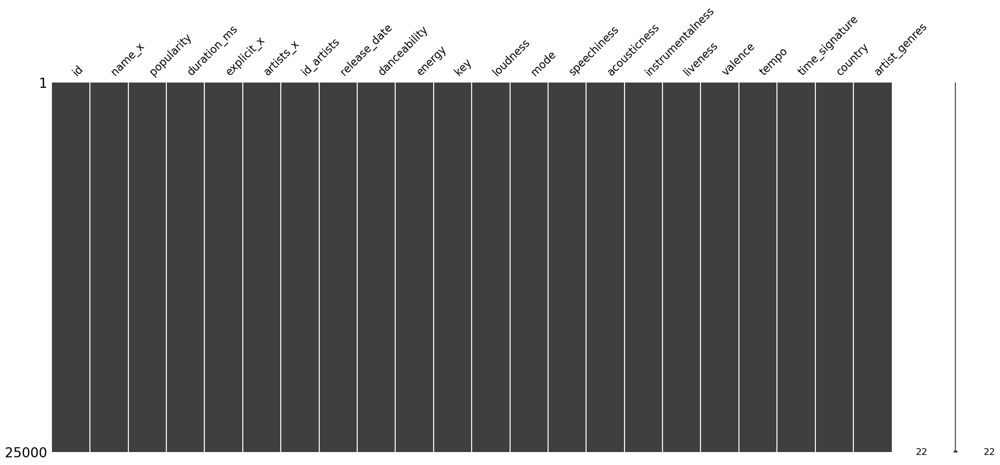

In [6]:

%matplotlib inline
msno.matrix(df_Smarta.sample(25000))

Ahora, nos quedamos sólo con el año en la columna release_date (año de lanzamiento) y creamos una variable llamada Years que contiene una serie .

In [7]:
years = df_Smarta.release_date.dt.year
years

0          1942
1          1942
2          1942
3          1942
4          1942
           ... 
3248249    2020
3248250    2020
3248251    2020
3248252    2020
3248253    2020
Name: release_date, Length: 3248254, dtype: int64

In [8]:
df_Smarta.columns 

Index(['id', 'name_x', 'popularity', 'duration_ms', 'explicit_x', 'artists_x',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'country',
       'artist_genres'],
      dtype='object')

Creamos una columna llamada years 

In [9]:
df_Smarta['years'] = years
df_Smarta.head()

,id,name_x,popularity,duration_ms,explicit_x,artists_x,id_artists,release_date,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,country,artist_genres,years
0,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'...",1942
1,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'...",1942
2,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'...",1942
3,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'...",1942
4,4so0Wek9Ig1p6CRCHuINwW,White Christmas,56,177480,0,"['Bing Crosby', 'Ken Darby Singers', 'John Sco...","['6ZjFtWeHP9XN7FeKSUe80S', '69UfPJgUmFFAVT740q...",1942-01-01,0.317,0.158,...,0.0381,0.673,0.353,0.338,0.247,130.503,3,global,"['easy listening', 'adult standards', 'lounge'...",1942


Voilá , aquí aparece añadida 

In [10]:
df_Smarta.columns 

Index(['id', 'name_x', 'popularity', 'duration_ms', 'explicit_x', 'artists_x',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'country',
       'artist_genres', 'years'],
      dtype='object')

Creamos un índice con los valores unicos de los años (years),agrupados por años. 

In [11]:
tracks_by_year = df_Smarta.groupby('years').count()
tracks_by_year

,id,name_x,popularity,duration_ms,explicit_x,artists_x,id_artists,release_date,danceability,energy,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,country,artist_genres
years,,,,,,,,,,,,,,,,,,,,,
1942,753,753,753,753,753,753,753,753,753,753,...,753,753,753,753,753,753,753,753,753,753
1944,43,43,43,43,43,43,43,43,43,43,...,43,43,43,43,43,43,43,43,43,43
1945,73,73,73,73,73,73,73,73,73,73,...,73,73,73,73,73,73,73,73,73,73
1946,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
1947,91,91,91,91,91,91,91,91,91,91,...,91,91,91,91,91,91,91,91,91,91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,370061,370061,370061,370061,370061,370061,370061,370061,370061,370061,...,370061,370061,370061,370061,370061,370061,370061,370061,370061,370061
2018,499664,499664,499664,499664,499664,499664,499664,499664,499664,499664,...,499664,499664,499664,499664,499664,499664,499664,499664,499664,499664
2019,582315,582315,582315,582315,582315,582315,582315,582315,582315,582315,...,582315,582315,582315,582315,582315,582315,582315,582315,582315,582315


Agrupamos el DF por año de lanzamiento de las canciones, y contamos el numero que sale en cada año. Nos da una serie que cuenta las canciones.(el numero se incrementa en los ultimos años)

In [13]:
#Suma= df_tracks.groupby(df_tracks.release_date.dt.year)['years']
#Suma
num_tracks_by_year = df_Smarta.groupby(df_Smarta.release_date.dt.year)['release_date'].count()
num_tracks_by_year

release_date
1942       753
1944        43
1945        73
1946         2
1947        91
         ...  
2017    370061
2018    499664
2019    582315
2020    507428
2021    106907
Name: release_date, Length: 74, dtype: int64

Añadimos la gráfica. Esta parece indicar que a partir finales de la segunda guerra mundial, se produce una expansión en el terreno musical, cuando se establece el NOEI , y posteriormente vuelve a disminuir durante la decada de los 70. (Guerra de Yom Kipppur). Añadiremos un análissi por décadas . 

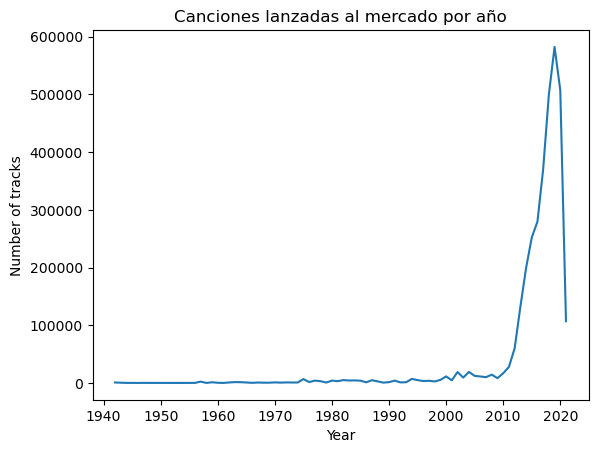

In [14]:
num_tracks_by_year.plot()
plt.title('Canciones lanzadas al mercado por año')
plt.xlabel('Year')
plt.ylabel('Number of tracks')
plt.show()


Podemos ver algunas características agrupando por artistas, géneros o paises y ver cuales son las preferencias de cada región. Recordemos que el tempom que valence indica si la canción es más triste o alegre.

In [16]:
num_tracks_by_artists = df_Smarta.groupby('id_artists')["tempo"].value_counts()
num_tracks_by_artists

id_artists                                            tempo  
['003aZdOERqXUCxNAS91ZZt']                            112.139     19
['006j2rer9tZJCYniu7SaWS']                            105.015      9
['007FXgr0jLBJxhPJjacXQH', '1AL2GKpmRrKXkYIcASuRFa']  77.952      17
['007FXgr0jLBJxhPJjacXQH', '43DRDu6nLSeIedZ7T1A616']  168.036     55
['007FXgr0jLBJxhPJjacXQH', '48HORs6F9P7IgdyKrk4MZC']  76.074      26
                                                                ... 
['7zpvy5B9gb5KprNUzNCOEE']                            132.036      1
                                                      154.977      1
['7zrkALJ9ayRjzysp4QYoEg', '5vssQp6TyMHsx4mihKVAsC']  115.055      2
['7zsin6IgVsR1rqSRCNYDwq']                            174.564    786
['7zup4xIPjtv50lM7x3n4qW']                            131.918      1
Name: tempo, Length: 27246, dtype: int64

La función groupby agrupa los datos por el valor de la columna "years". Mean calcula la media de los valores de la columna "danceability" de cada grupo. El resultado se almacena en la variable num_tracks_by_danceability.

In [17]:
#num_tracks_by_year1 = df_tracks.groupby(df_tracks.danceability)['release_date'].count()
#num_tracks_by_year1
num_tracks_by_danceability = df_Smarta.groupby('years')['danceability'].mean()
num_tracks_by_danceability

years
1942    0.317000
1944    0.156000
1945    0.468233
1946    0.163000
1947    0.822736
          ...   
2017    0.691168
2018    0.688526
2019    0.695465
2020    0.711832
2021    0.699278
Name: danceability, Length: 74, dtype: float64

Mostramos el resultado gráfico.La columna "danceability" en un conjunto de datos de música generalmente representa una medida de qué tan fácil es bailar una canción, basada en una combinación de elementos como el ritmo, la estabilidad del tempo y la regularidad del sonido.

Los valores de la columna "danceability" pueden variar entre 0 y 1, donde 0 significa que la canción es difícil de bailar y 1 significa que es muy fácil de bailar.

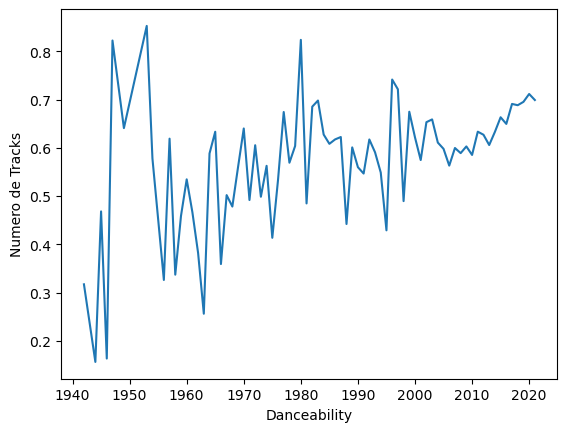

In [18]:
plt.plot(num_tracks_by_danceability.index, num_tracks_by_danceability)
plt.xlabel('Danceability')
plt.ylabel('Numero de Tracks')
plt.show()

In [20]:
num_tracks_by_valence = df_Smarta.groupby('years')['valence'].mean()
num_tracks_by_valence

years
1942    0.247000
1944    0.107000
1945    0.586795
1946    0.104000
1947    0.957648
          ...   
2017    0.508116
2018    0.476568
2019    0.539785
2020    0.542714
2021    0.577677
Name: valence, Length: 74, dtype: float64

Valence: Una medida de 0.0 a 1.0 que describe la positividad musical transmitida por una pista. Las pistas con una valencia alta suenan más positivas 

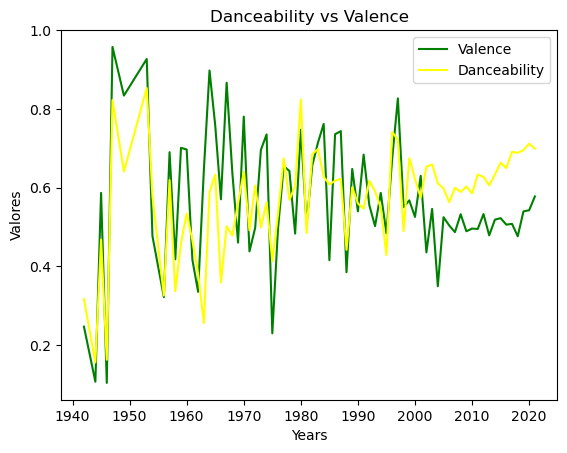

In [21]:
plt.plot(num_tracks_by_valence.index, num_tracks_by_valence, color = "green", label = "Valence")
plt.plot(num_tracks_by_danceability.index, num_tracks_by_danceability, color='yellow', label='Danceability')
plt.title('Danceability vs Valence')
plt.xlabel('Years')
plt.ylabel('Valores')
plt.legend()
plt.show()

Agrupamos por años y calculamos los valores medios del tempo

In [22]:
num_tracks_by_tempo = df_Smarta.groupby('years')['tempo'].mean()
num_tracks_by_tempo

years
1942    130.503000
1944    180.887000
1945    117.935041
1946     80.755000
1947     99.129593
           ...    
2017    118.510182
2018    119.773108
2019    119.421890
2020    123.715624
2021    125.064226
Name: tempo, Length: 74, dtype: float64

La mayoría de las canciones populares de hoy están escritas en un rango de tempo de 100 a 140 BPM. Por ejemplo, "Beat It" de Michael Jackson registra 138 BPM mientras que "Dancing Queen" de ABBA tiene exactamente 100 BPM. Muchos compositores consideran que 120 BPM es el tempo perfecto para crear un éxito. Ese es el tempo utilizado en "Girls Just Wanna Have Fun" de Cyndi Lauper y "Rumour Has It" de Adele. Mientras tanto, muchas canciones de hip-hop usan tempos algo más lentos, lo que permite a los MC maximizar el número de sílabas en sus rimas.

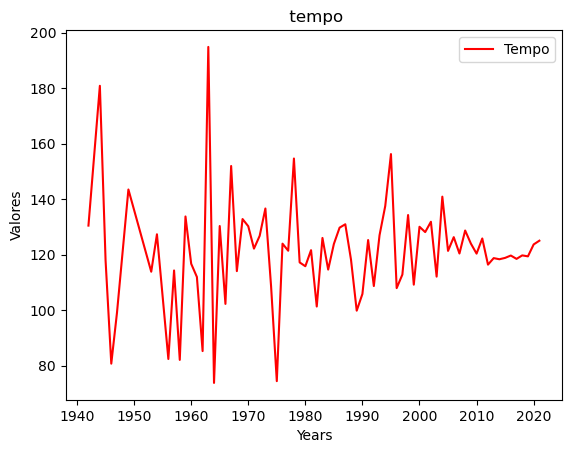

In [23]:
#plt.plot(num_tracks_by_valence.index, num_tracks_by_valence, color = "green", label = "Valence")
#plt.plot(num_tracks_by_danceability.index, num_tracks_by_danceability, color='yellow', label='Danceability')
plt.plot(num_tracks_by_tempo.index, num_tracks_by_tempo, color='red', label='Tempo')    
plt.title(' tempo')
plt.xlabel('Years')
plt.ylabel('Valores')
plt.legend()
plt.show()

#### Falta  Añadir generos frente a los años y comparar los generos después del merge con los BPM.Vemos como el numero de canciones lanzadas al mercado ha aumentado a lo largo de los años, aunque se pueden observar cambios en décadas concretas. 

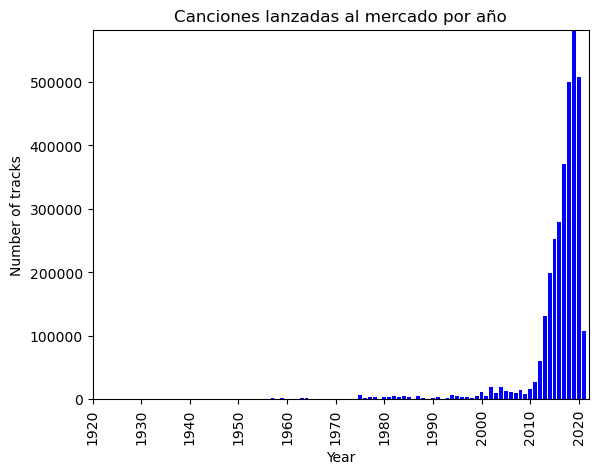

In [24]:
years = num_tracks_by_year.index.tolist()
num_songs = num_tracks_by_year.values.tolist()

plt.bar(years, num_songs, width=0.8, color = "blue")
plt.title('Canciones lanzadas al mercado por año')
plt.xlabel('Year')
plt.ylabel('Number of tracks')
plt.xlim(1920, 2022)
plt.xticks(range(1920, 2022, 10), rotation=90)
plt.ylim([0, max(num_songs)+100])

plt.show()

funcion para crear una nueva columna decada: nos quedamos con los primeros tres numeros y luego multiplicando por 10 nos da la decada. Creamos una nueva columna decada aplicando la funcion a cada año

In [26]:
def year_to_decade(years):
    decade = (years//10) * 10
    decade = f'{decade}s'
    return decade

df_Smarta['decade'] = df_Smarta['years'].apply(lambda x: year_to_decade(x))


Compruebo su está añadida la columna década

In [27]:
df_Smarta.columns

Index(['id', 'name_x', 'popularity', 'duration_ms', 'explicit_x', 'artists_x',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature', 'country',
       'artist_genres', 'years', 'decade'],
      dtype='object')

In [28]:
df_Smarta.decade

0          1940s
1          1940s
2          1940s
3          1940s
4          1940s
           ...  
3248249    2020s
3248250    2020s
3248251    2020s
3248252    2020s
3248253    2020s
Name: decade, Length: 3248254, dtype: object

Ahora lo hacemos graficamente 

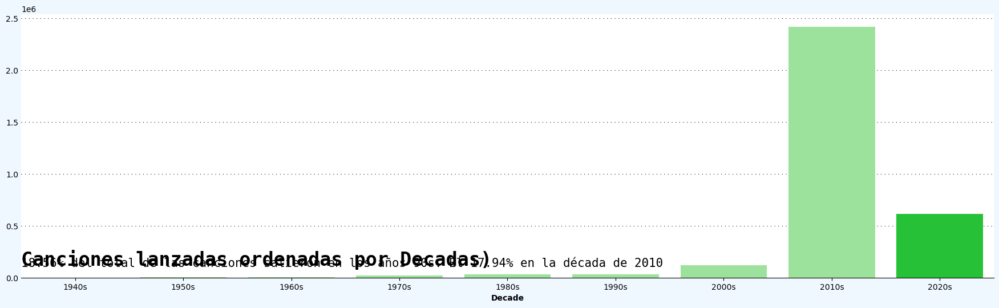

In [29]:

df_tracks = df_Smarta.sort_values('decade')
fig = plt.figure(figsize = (22,6),facecolor = 'AliceBlue')
gs = fig.add_gridspec(1,1)
ax = fig.add_subplot(gs[0,0])

ax.text(-0.5, 115000, 
         'Canciones lanzadas ordenadas por Decadas)', 
         fontsize=24, 
         fontweight='bold', 
         fontfamily='monospace'
        )

ax.text(-0.5, 108000, 
         "18.56% del total de las canciones salieron en los años 90s. El 17.94% en la década de 2010" , 
         fontsize=15, 
         fontweight='light', 
         fontfamily='monospace'
        )

ax.grid(color='black', linestyle=':', axis='y', zorder=0,  dashes=(1,5))


colormap = ["lightgreen" for _ in range(12)]
colormap[8] = "#0ddb22"

sns.countplot(data = df_tracks, x ='decade', ax = ax, palette = colormap, alpha = 1, zorder = 2)


for direction in ['top','right','left']:
    ax.spines[direction].set_visible(False)

ax.set_xlabel('Decade', fontsize = 10, fontweight = 'bold')
ax.tick_params(axis = 'x', labelsize=10)
ax.tick_params(axis = 'y', length=0, labelsize=10)
ax.set_ylabel('',)
plt.savefig('decadas_canciones.svg', dpi=100)

por si hay que guardar la imagen

In [384]:
from IPython.display import Image
Image('decadas_canciones.png')
plt.show("decadas_canciones.png")

Vamos a ver en porcentajes cuantas canciones salieron en cada década, para añadir la información al grafico

In [440]:
value_counts = df_tracks.decade.value_counts(normalize=True)
value_counts = value_counts * 100
value_counts = value_counts.round(2).astype(str) + '%'
print(value_counts)

1990s    18.56%
2010s    17.94%
2000s     14.8%
1980s    14.03%
1970s    10.54%
1960s     8.06%
1950s     6.03%
2020s     3.45%
1940s     3.08%
1930s     2.22%
1920s      1.3%
1900s      0.0%
Name: decade, dtype: object


Nos fijamos en los valores de aquellas canciones o artistas más populares. Por ejemplo, los BPM (time_signature) son compases de 4/4, bailables, sin mucha letra etc La popularidad se mide a través de un algoritmo , número total de reproducciones que ha tenido la pista y cuán recientes son esas reproducciones

In [287]:
most_popular = df_tracks.query("popularity>=90", inplace= False).sort_values(by = "popularity", ascending = False)
most_popular[:20]

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,years
93802,4iJyoBOLtHqaGxP12qzhQI,Peaches (feat. Daniel Caesar & Giveon),100,198082,1,"['Justin Bieber', 'Daniel Caesar', 'Giveon']","['1uNFoZAHBGtllmzznpCI3s', '20wkVLutqVOYrc0kxF...",2021-03-19,0.677,0.696,...,-6.181,1,0.1190,0.32100,0.000000,0.4200,0.464,90.030,4,2021
93803,7lPN2DXiMsVn7XUKtOW1CS,drivers license,99,242014,1,['Olivia Rodrigo'],['1McMsnEElThX1knmY4oliG'],2021-01-08,0.585,0.436,...,-8.761,1,0.0601,0.72100,0.000013,0.1050,0.132,143.874,4,2021
93804,3Ofmpyhv5UAQ70mENzB277,Astronaut In The Ocean,98,132780,0,['Masked Wolf'],['1uU7g3DNSbsu0QjSEqZtEd'],2021-01-06,0.778,0.695,...,-6.865,0,0.0913,0.17500,0.000000,0.1500,0.472,149.996,4,2021
92810,5QO79kh1waicV47BqGRL3g,Save Your Tears,97,215627,1,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.680,0.826,...,-5.487,1,0.0309,0.02120,0.000012,0.5430,0.644,118.051,4,2020
92811,6tDDoYIxWvMLTdKpjFkc1B,telepatía,97,160191,0,['Kali Uchis'],['1U1el3k54VvEUzo3ybLPlM'],2020-12-04,0.653,0.524,...,-9.016,0,0.0502,0.11200,0.000000,0.2030,0.553,83.970,4,2020
93805,7MAibcTli4IisCtbHKrGMh,Leave The Door Open,96,242096,0,"['Bruno Mars', 'Anderson .Paak', 'Silk Sonic']","['0du5cEVh5yTK9QJze8zA0C', '3jK9MiCrA42lLAdMGU...",2021-03-05,0.586,0.616,...,-7.964,1,0.0324,0.18200,0.000000,0.0927,0.719,148.088,4,2021
92813,0VjIjW4GlUZAMYd2vXMi3b,Blinding Lights,96,200040,0,['The Weeknd'],['1Xyo4u8uXC1ZmMpatF05PJ'],2020-03-20,0.514,0.730,...,-5.934,1,0.0598,0.00146,0.000095,0.0897,0.334,171.005,4,2020
92814,6f3Slt0GbA2bPZlz0aIFXN,The Business,95,164000,0,['Tiësto'],['2o5jDhtHVPhrJdv3cEQ99Z'],2020-09-16,0.798,0.620,...,-7.079,0,0.2320,0.41400,0.019200,0.1120,0.235,120.031,4,2020
91866,60ynsPSSKe6O3sfwRnIBRf,Streets,94,226987,1,['Doja Cat'],['5cj0lLjcoR7YOSnhnX0Po5'],2019-11-07,0.749,0.463,...,-8.433,1,0.0828,0.20800,0.037100,0.3370,0.190,90.028,4,2019
93807,4cG7HUWYHBV6R6tHn1gxrl,Friday (feat. Mufasa & Hypeman) - Dopamine Re-...,94,169153,0,"['Riton', 'Nightcrawlers', 'Mufasa & Hypeman',...","['7i9j813KFoSBMldGqlh2Z1', '1gALaWbNDnwS2ECV09...",2021-01-15,0.824,0.862,...,-3.424,1,0.1260,0.00760,0.000132,0.3030,0.801,122.980,4,2021


In [ ]:
plt.figure(figsize=(20,5))
sns.violinplot(titanic_df["Fare"], color='deeppink');

In [ ]:
plt.figure(figsize=(10,10))
sns.boxplot(data=iris_df[iris_df.columns.values[0:4]]);

Sacamos los estadísticos básicos

In [62]:
basic_stat = df_tracks.describe().transpose()
basic_stat

,count,mean,std,min,25%,50%,75%,max
popularity,586672.0,27.570053,18.370642,0.0,13.0000,27.000000,41.00000,100.000
duration_ms,586672.0,230051.167286,126526.087418,3344.0,175093.0000,214893.000000,263867.00000,5621218.000
explicit,586672.0,0.044086,0.205286,0.0,0.0000,0.000000,0.00000,1.000
danceability,586672.0,0.563594,0.166103,0.0,0.4530,0.577000,0.68600,0.991
energy,586672.0,0.542036,0.251923,0.0,0.3430,0.549000,0.74800,1.000
key,586672.0,5.221603,3.519423,0.0,2.0000,5.000000,8.00000,11.000
loudness,586672.0,-10.206067,5.089328,-60.0,-12.8910,-9.243000,-6.48200,5.376
mode,586672.0,0.658797,0.474114,0.0,0.0000,1.000000,1.00000,1.000
speechiness,586672.0,0.104864,0.179893,0.0,0.0340,0.044300,0.07630,0.971
acousticness,586672.0,0.449863,0.348837,0.0,0.0969,0.422000,0.78500,0.996


Creamos una función para que los valores no estén en notaciones científicas y sean más legibles, con dos decimales . Aquí podemos sacar algunas conclusiones sobre la normalidad, dado que en varias variables media y moda son practicamente iguales, lo que podría indicar normalidad.

In [63]:
Bstat = basic_stat.applymap(lambda x: '{:.2f}'.format(x))
Bstat

,count,mean,std,min,25%,50%,75%,max
popularity,586672.00,27.57,18.37,0.00,13.00,27.00,41.00,100.00
duration_ms,586672.00,230051.17,126526.09,3344.00,175093.00,214893.00,263867.00,5621218.00
explicit,586672.00,0.04,0.21,0.00,0.00,0.00,0.00,1.00
danceability,586672.00,0.56,0.17,0.00,0.45,0.58,0.69,0.99
energy,586672.00,0.54,0.25,0.00,0.34,0.55,0.75,1.00
key,586672.00,5.22,3.52,0.00,2.00,5.00,8.00,11.00
loudness,586672.00,-10.21,5.09,-60.00,-12.89,-9.24,-6.48,5.38
mode,586672.00,0.66,0.47,0.00,0.00,1.00,1.00,1.00
speechiness,586672.00,0.10,0.18,0.00,0.03,0.04,0.08,0.97
acousticness,586672.00,0.45,0.35,0.00,0.10,0.42,0.79,1.00


Modificamos el dataframe original con inplace y ponemos un nuevo indice 

In [31]:
df_tracks.set_index("release_date", inplace = True)
df_tracks.index = pd.to_datetime(df_tracks.index)
df_tracks.tail()


,id,name,popularity,duration_ms,explicit,artists,id_artists,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,years
release_date,,,,,,,,,,,,,,,,,,,,
2020-09-26,5rgu12WBIHQtvej2MdHSH0,云与海,50,258267,0,['阿YueYue'],['1QLBXKM5GCpyQQSVMNZqrZ'],0.560,0.518,0,-7.471,0,0.0292,0.785,0.000000,0.0648,0.2110,131.896,4,2020
2020-10-21,0NuWgxEp51CutD2pJoF4OM,blind,72,153293,0,['ROLE MODEL'],['1dy5WNgIKQU6ezkpZs4y8z'],0.765,0.663,0,-5.223,1,0.0652,0.141,0.000297,0.0924,0.6860,150.091,4,2020
2020-09-02,27Y1N4Q4U3EfDU5Ubw8ws2,What They'll Say About Us,70,187601,0,['FINNEAS'],['37M5pPGs6V1fchFJSgCguX'],0.535,0.314,7,-12.823,0,0.0408,0.895,0.000150,0.0874,0.0663,145.095,4,2020
2021-03-05,45XJsGpFTyzbzeWK8VzR8S,A Day At A Time,58,142003,0,"['Gentle Bones', 'Clara Benin']","['4jGPdu95icCKVF31CcFKbS', '5ebPSE9YI5aLeZ1Z2g...",0.696,0.615,10,-6.212,1,0.0345,0.206,0.000003,0.3050,0.4380,90.029,4,2021
2015-07-01,5Ocn6dZ3BJFPWh4ylwFXtn,Mar de Emociones,38,214360,0,['Afrosound'],['0i4Qda0k4nf7jnNHmSNpYv'],0.686,0.723,6,-7.067,1,0.0363,0.105,0.000000,0.2640,0.9750,112.204,4,2015


Buscamos un artista especifico , para hacer suposiciones sobre artistas concretos

In [288]:
df_tracks[["artists","name","popularity"]].iloc[586600]

artists                           ['CityAlight']
name          Yet Not I but Through Christ in Me
popularity                                    58
Name: 586600, dtype: object

Fórmula para convertir la duracion a minutos, pero se pierde mucha información , mejor a segundos 

In [32]:
"""df_tracks["duration_min"]= df_tracks["duration_ms"]/60000
df_tracks["duration_min"] = df_tracks["duration_min"].astype(int)
df_tracks.columns = df_tracks.columns.tolist()
df_tracks.head()
df_tracks.columns[19]"""

'df_tracks["duration_min"]= df_tracks["duration_ms"]/60000\ndf_tracks["duration_min"] = df_tracks["duration_min"].astype(int)\ndf_tracks.columns = df_tracks.columns.tolist()\ndf_tracks.head()\ndf_tracks.columns[19]'

Usamos una función para convertir de ms a segundos 

In [290]:
df_tracks["duration_ms"].apply(lambda x: round(x/1000))

0         127
1          98
2         182
3         177
4         163
         ... 
586667    258
586668    153
586669    188
586670    142
586671    214
Name: duration_ms, Length: 586672, dtype: int64

Cambiamos a duracion segundos creando una columna y eliminado milisegundos 

In [292]:
df_tracks["duration"] = df_tracks["duration_ms"].apply(lambda x: round(x/1000))
df_tracks.drop("duration_ms", axis = 1, inplace = True)
df_tracks.duration.head()

0    127
1     98
2    182
3    177
4    163
Name: duration, dtype: int64

Heatmap con las correlaciones para ver las interesantes.  Varias pruebas hechas con colores etc

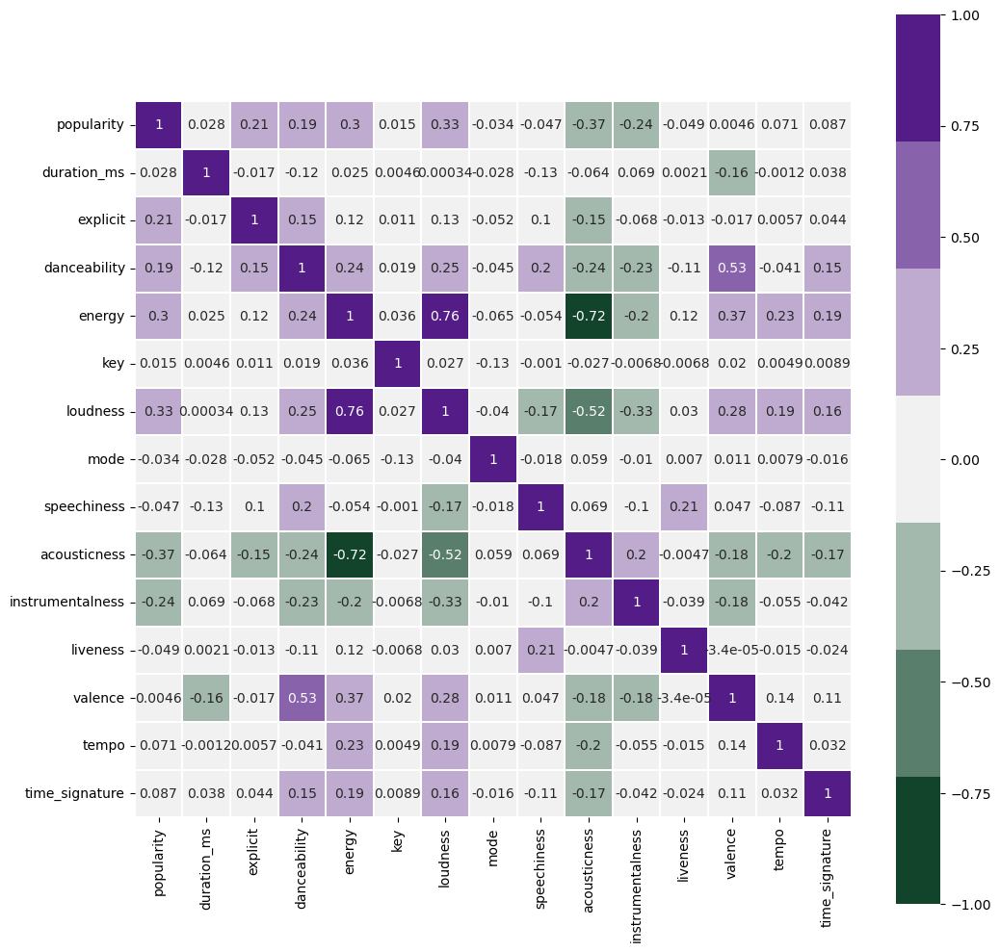

In [6]:
plt.figure(figsize=(12,12))
sns.heatmap(df_tracks.corr(),
            vmin=-1,
            vmax=1,
            cmap=sns.diverging_palette(145, 280, s=85, l=25, n=7),
            square=True,
            linewidths=.1,
            annot=True);


[Text(0.5, 0, 'popularity'),
 Text(1.5, 0, 'danceability'),
 Text(2.5, 0, 'energy'),
 Text(3.5, 0, 'loudness'),
 Text(4.5, 0, 'speechiness'),
 Text(5.5, 0, 'acousticness'),
 Text(6.5, 0, 'instrumentalness'),
 Text(7.5, 0, 'liveness'),
 Text(8.5, 0, 'valence'),
 Text(9.5, 0, 'tempo'),
 Text(10.5, 0, 'time_signature'),
 Text(11.5, 0, 'duration')]

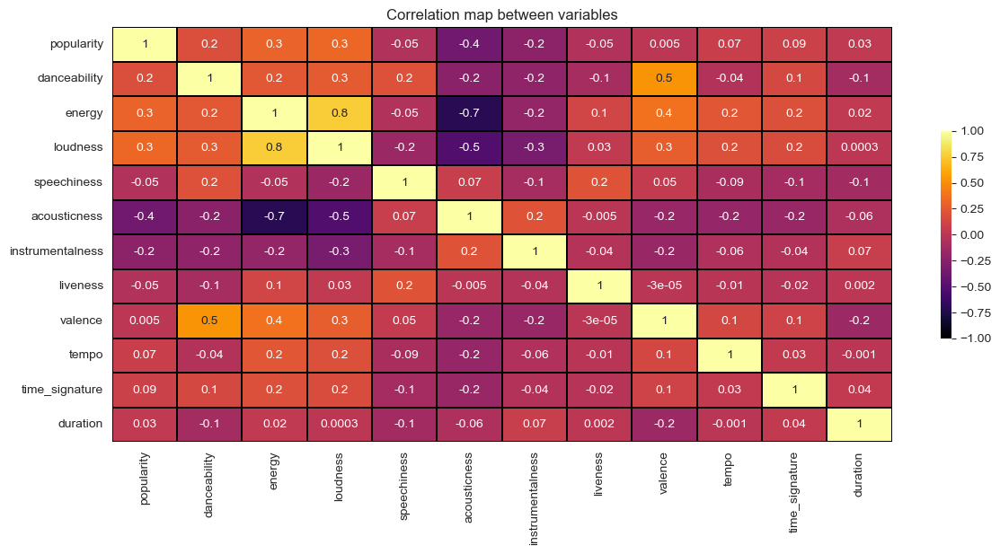

In [72]:
corr_df = df_tracks.drop(["key","mode","explicit"], axis = 1).corr(method="pearson")  #Calculamos la matriz de correlaciones
plt.figure(figsize=(14,6))
heatmap= sns.heatmap(corr_df,annot=True,fmt=".1g",vmin=-1,vmax=1, center=0, cmap="inferno",square=False, linewidths=.1,linecolor ="black", cbar_kws={"shrink": .5})
heatmap.set_title("Correlation map between variables")
heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation= 90)

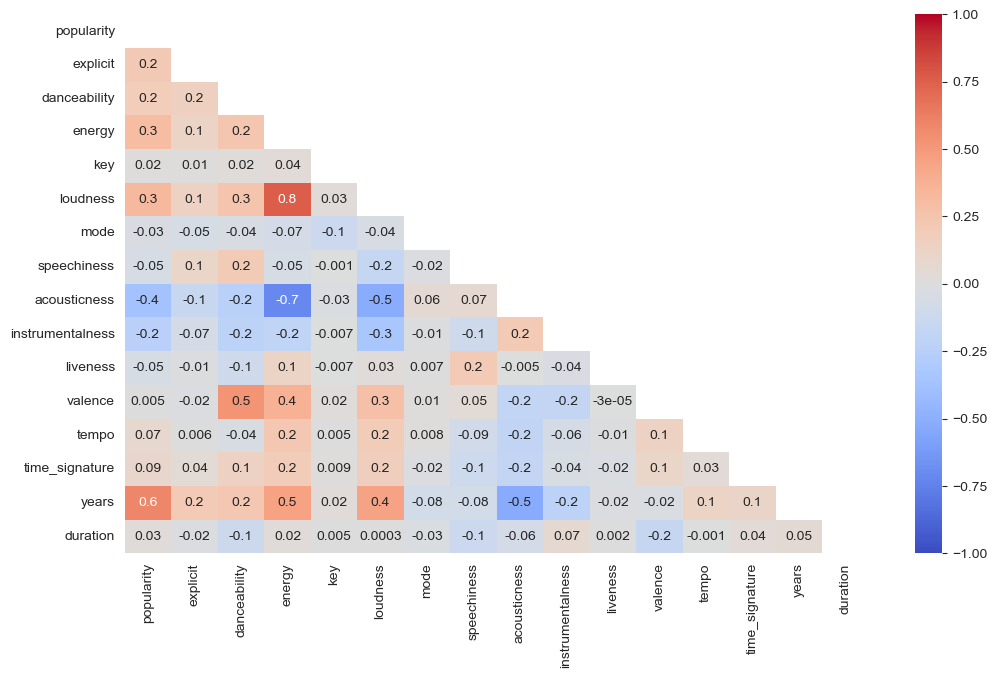

In [393]:
#Definimos la matriz de correlación como la fuente de nuestros datos
corr = df_tracks.corr()
#Definimos el tamaño de la figura 
ax = plt.subplots(figsize=(12,7))

#Generamos una máscara para evitar tener un espejo en la parte superior de la gráfica y simplificar la observación
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(corr,annot=True,cmap='coolwarm',fmt=".1g",vmin=-1,vmax=1, center=0,mask = mask) #viridis


Creo que me quedo con esta que es mas clara 

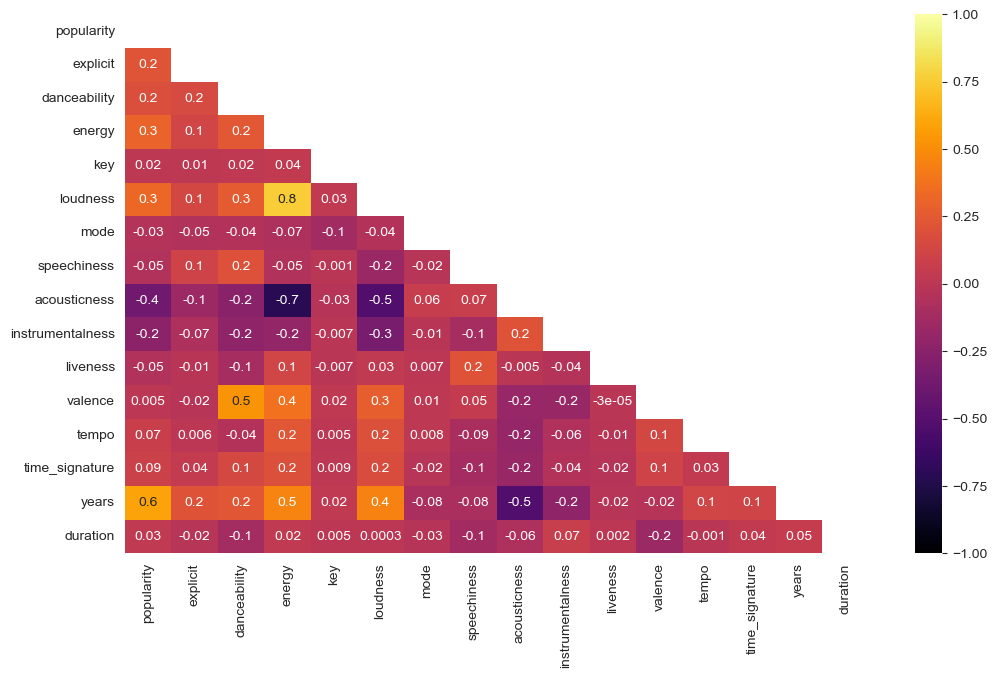

In [392]:
#Definimos la matriz de correlación como la fuente de nuestros datos
corr = df_tracks.corr()
#Definimos el tamaño de la figura 
ax = plt.subplots(figsize=(12,7))

#Generamos una máscara para evitar tener un espejo en la parte superior de la gráfica y simplificar la observación
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

ax = sns.heatmap(corr,annot=True,cmap='inferno',fmt=".1g",vmin=-1,vmax=1, center=0,mask = mask) #viridis


In [73]:
df_tracks.artists.nunique() 

114030

In [74]:
df_tracks.artists.value_counts() 

['Die drei ???']                   3856
['TKKG Retro-Archiv']              2006
['Benjamin Blümchen']              1503
['Bibi Blocksberg']                1472
['Lata Mangeshkar']                1373
                                   ... 
['IU', 'Jang Yi-jeong']               1
['黃宗澤']                               1
['Vincy Chan', '海鳴威']                 1
['Dough-Boy']                         1
['Gentle Bones', 'Clara Benin']       1
Name: artists, Length: 114030, dtype: int64

In [49]:
sample_df = df_tracks.sample(int(0.004*len(df_tracks)))
print(len(sample_df))

2346


Empiezo a hacer visualizaciones de las correlaciones

[Text(0.5, 1.0, 'Loudness vs Energy Correlation')]

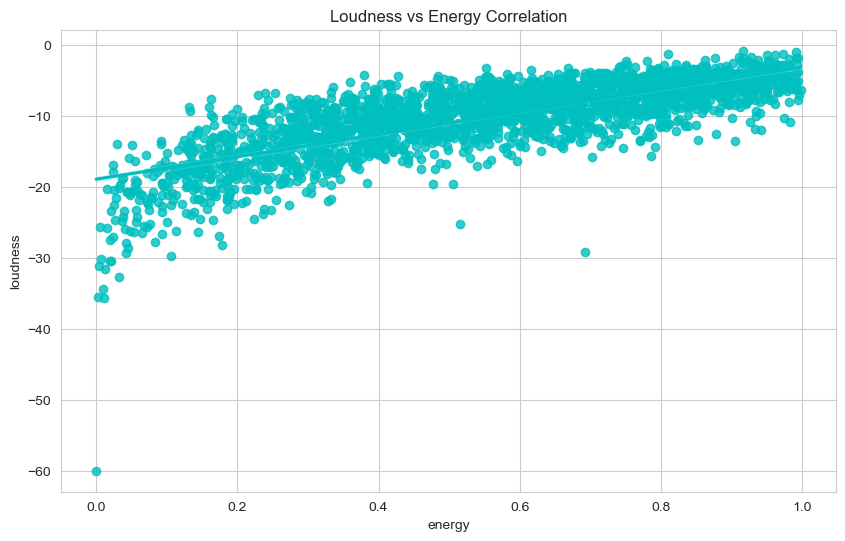

In [50]:
plt.figure(figsize=(10,6))
sns.regplot(data= sample_df, y= "loudness", x="energy", color = "c").set(title= "Loudness vs Energy Correlation")

[Text(0.5, 1.0, 'Popularity vs Acousticness Correlation')]

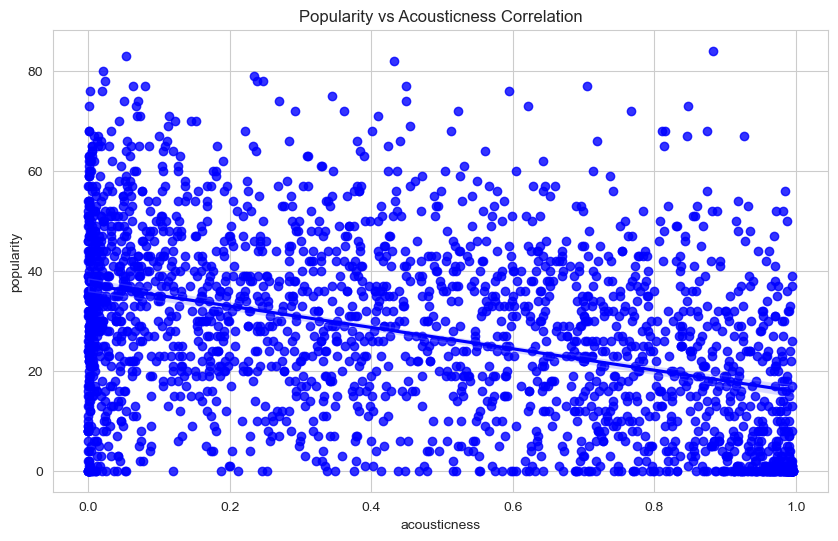

In [51]:
plt.figure(figsize=(10,6))
sns.regplot(data= sample_df, y= "popularity", x="acousticness", color = "b").set(title= "Popularity vs Acousticness Correlation")

Creo la 

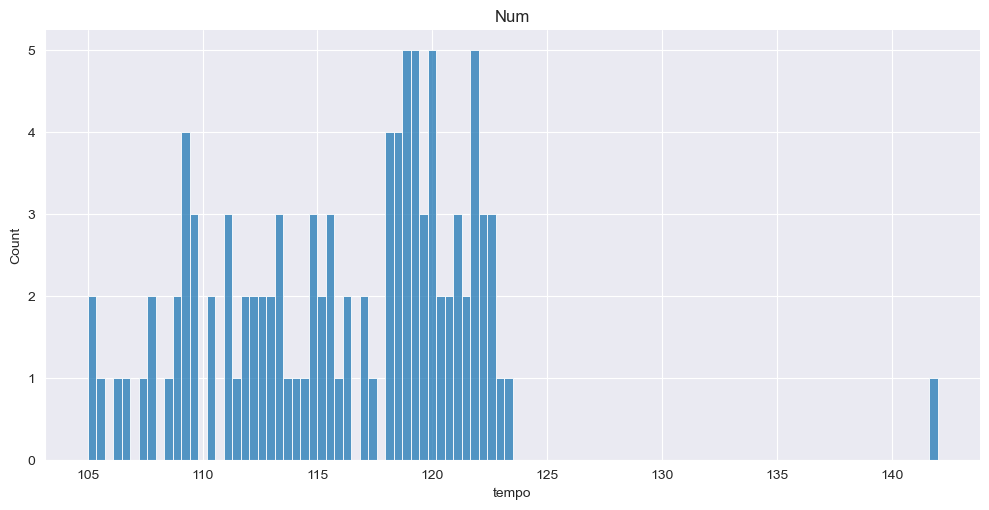

In [414]:
sns.displot(num_tracks_by_tempo,aspect=2,height=5,kind= "hist", kde=False, bins=100).set(title= "Num")

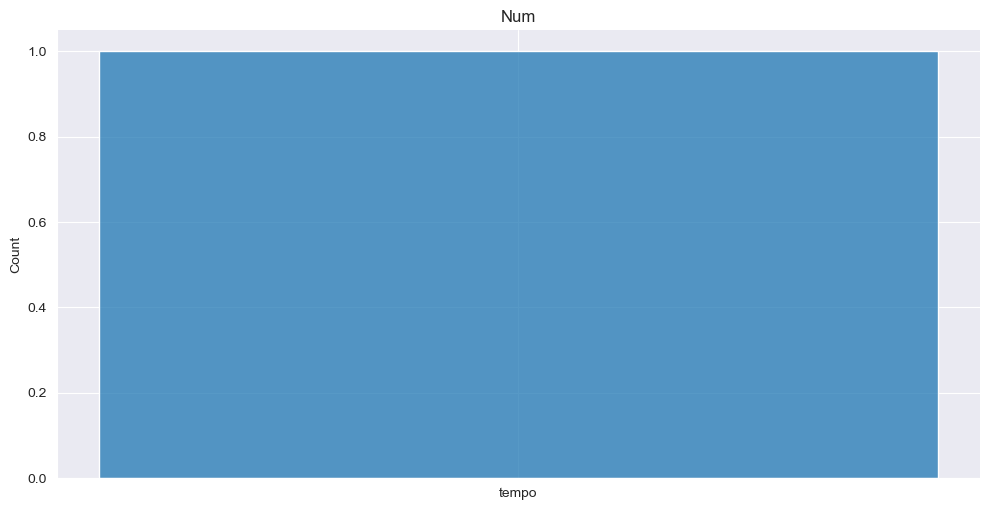

In [420]:
sns.displot("tempo",aspect=2,height=5,kind= "hist", kde=False, bins=30).set(title= "Num")
plt.show()

In [4]:
df_tracks.columns

Index(['id', 'name', 'popularity', 'duration_ms', 'explicit', 'artists',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')

In [336]:
total_dr= df_tracks[duration_ms].sum()
fig_dims= (18,7)
fig,ax = plt.subplots(figsize= fig_dims)
fig= sns.barplot( x= years, y= duration_ms).set(title= "Year vs duration")
plt.xticks(rotation=90)

NameError: name 'duration_ms' is not defined

In [85]:
print(df_tracks.duplicated(subset=['duration']).any())
print(years.duplicated().any())

True
True


In [86]:
print(df_tracks['duration'].isnull().sum())
print(years.isnull().sum())

0
0


In [88]:
total_dr= df_tracks.duration
total_dr

release_date
1922-02-22    127
1922-06-01     98
1922-03-21    182
1922-03-21    177
1922-01-01    163
             ... 
2020-09-26    258
2020-10-21    153
2020-09-02    188
2021-03-05    142
2015-07-01    214
Name: duration, Length: 586672, dtype: int64

In [ ]:
plt.figure(figsize=(15,10))
sns.lineplot(data=suicid_df2,
             x="year",
             y="suicides_no",
             hue="country",
            linewidth = 3);

NameError: name 'suicid_df2' is not defined

<Figure size 1500x1000 with 0 Axes>

(array([1880., 1900., 1920., 1940., 1960., 1980., 2000., 2020., 2040.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

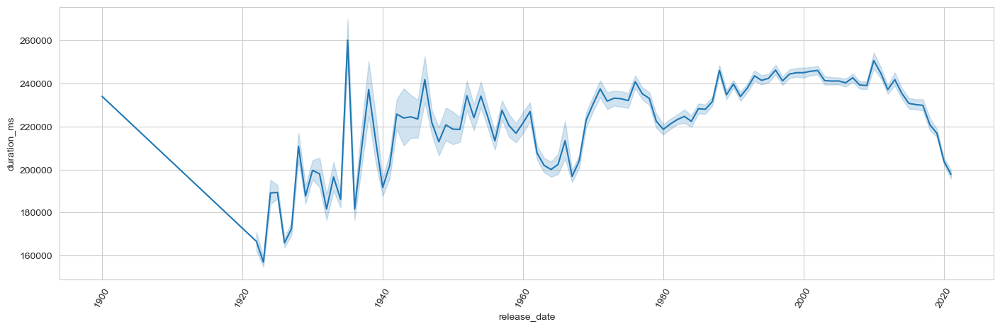

In [171]:
total_dr= df_tracks.duration_ms
sns.set_style(style="whitegrid")
fig_dims= (17,5)
fig, ax = plt.subplots(figsize= fig_dims)
fig= sns.lineplot(data=df_tracks, x= years, y= total_dr)
plt.xticks(rotation=60)

ValueError: array length 101 does not match index length 586672

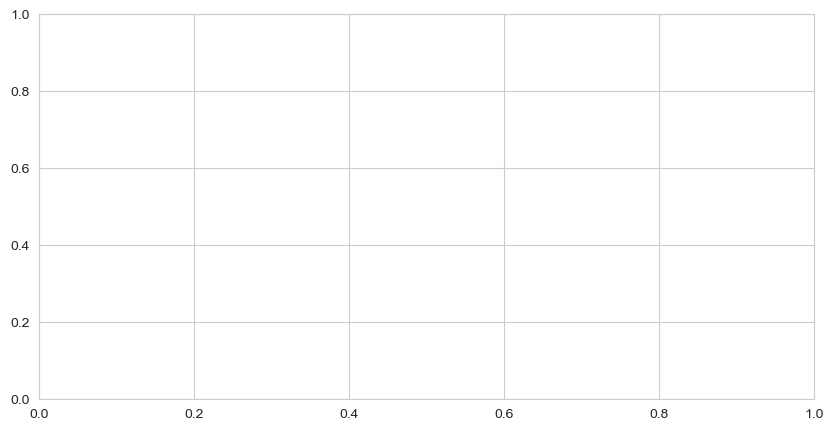

In [425]:
total = df_tracks.duration
sns.set_style(style = "whitegrid")
fig_dims = (10,5)
fig, ax = plt.subplots(figsize = fig_dims)
fig = sns.lineplot(x = years, y = total, ax = ax).set(title = "Year VS Duration")
plt.xticks(rotation = 60)

In [101]:
df_tracks.columns

Index(['id', 'name', 'popularity', 'explicit', 'artists', 'id_artists',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'time_signature', 'duration', 'dates'],
      dtype='object')

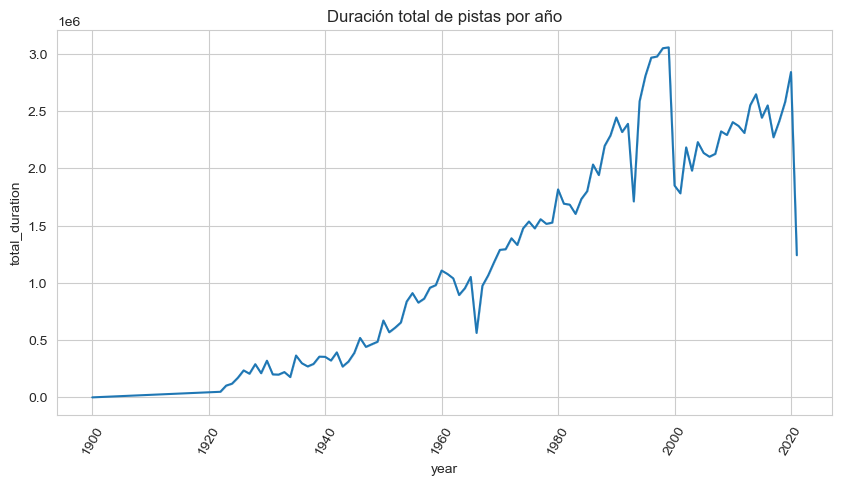

In [16]:
# extraer los años de la columna 'release_date' y guardarlos en una columna nueva llamada 'year'
df_tracks['year'] = pd.DatetimeIndex(df_tracks['release_date']).year




# sumar la duración de todas las pistas por año y guardar el resultado en una nueva columna llamada 'total_duration'
df_tracks['total_duration'] = df_tracks.groupby('year')['duration'].transform(sum)

# crear la gráfica de línea
sns.set_style(style="whitegrid")
fig_dims= (10,5)
fig, ax = plt.subplots(figsize= fig_dims)
sns.lineplot(x='year', y='total_duration', data=df_tracks, ax=ax)
plt.title('Duración total de pistas por año')
plt.xticks(rotation=60)

# mostrar la gráfica
plt.show()

In [17]:
print(df_tracks.columns)

Index(['id', 'name', 'popularity', 'duration_ms', 'explicit', 'artists',
       'id_artists', 'release_date', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')


In [ ]:
sns.pairplot(df_tracks.iloc[:,1:4],hue='genre')

Overall, the pairplot() function allows you to quickly visualize the pairwise relationships between different audio features, while also showing how the popularity of the track varies with those features. This can help you gain insights into which audio features are most strongly associated with track popularity, and can inform future decisions around music production and marketing.

In [ ]:
sns.pairplot(iris_df);

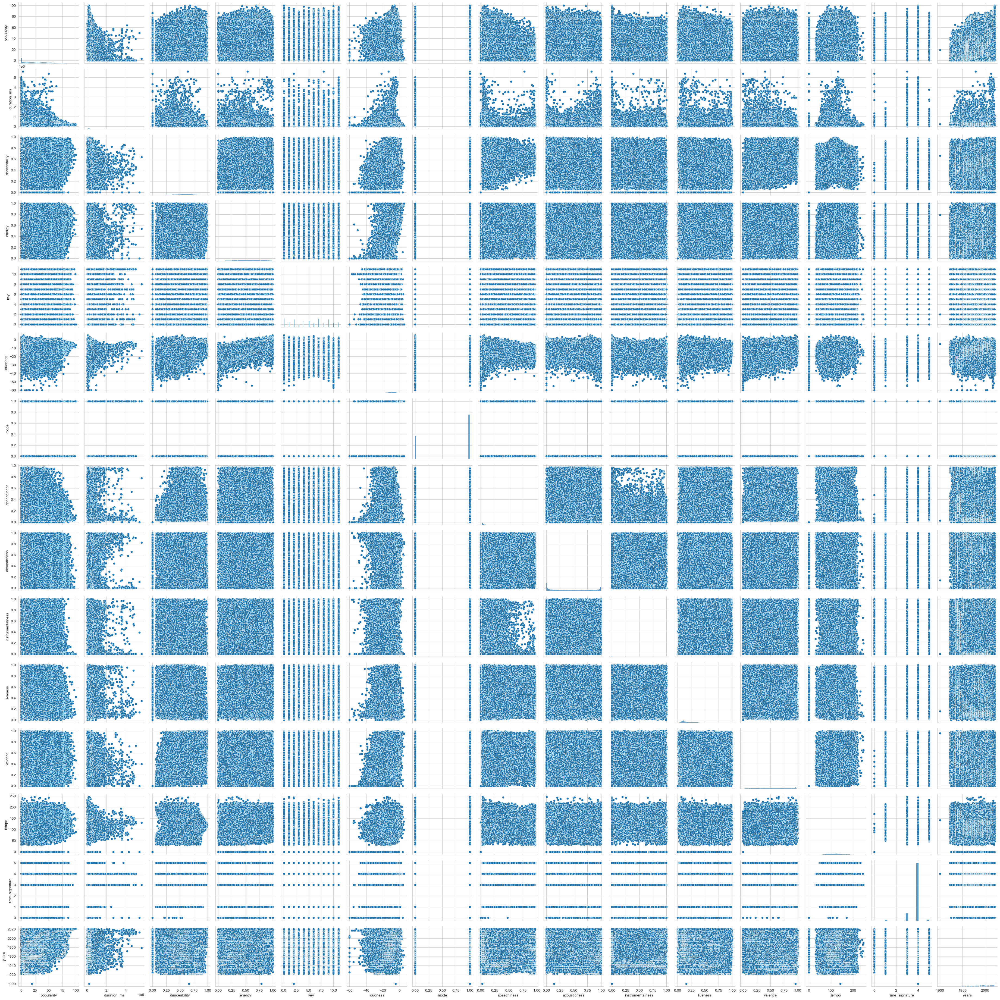

In [438]:
df_tracks_mod = df_tracks.drop([df_tracks.columns[1], df_tracks.columns[4], df_tracks.columns[6]], axis=1)
sns.pairplot(df_tracks_mod.iloc[:,1:18])

distribution plots

<AxesSubplot:xlabel='popularity'>

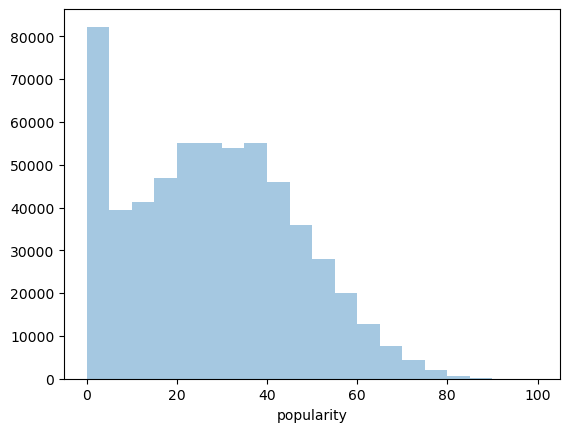

In [8]:
import warnings
warnings.filterwarnings('ignore')
sns.distplot(df_tracks['popularity'], kde=False, bins=20)

<AxesSubplot:xlabel='tempo', ylabel='Density'>

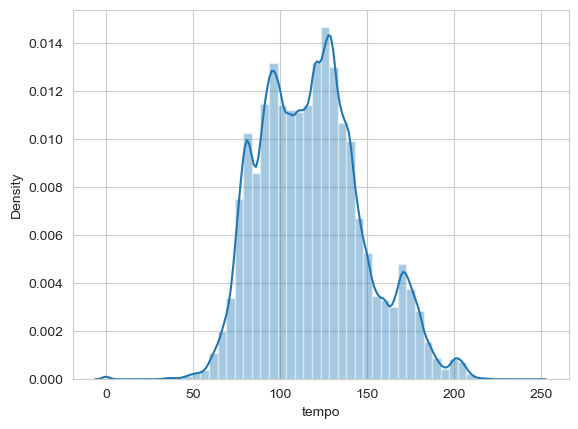

In [172]:
import warnings
warnings.filterwarnings('ignore')
sns.distplot(df_tracks["tempo"])

<AxesSubplot:xlabel='valence', ylabel='Density'>

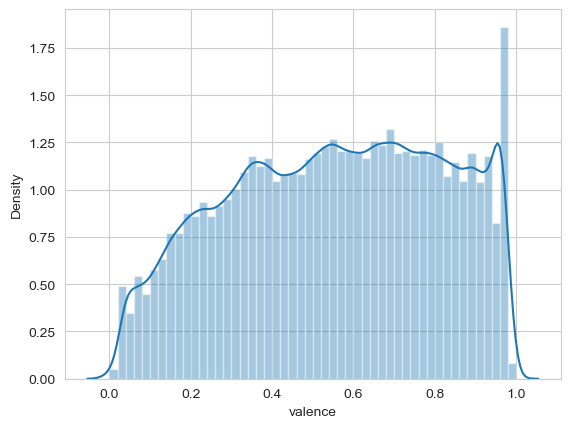

In [173]:
import warnings
warnings.filterwarnings('ignore')
sns.distplot(df_tracks["valence"])

<AxesSubplot:xlabel='energy', ylabel='Density'>

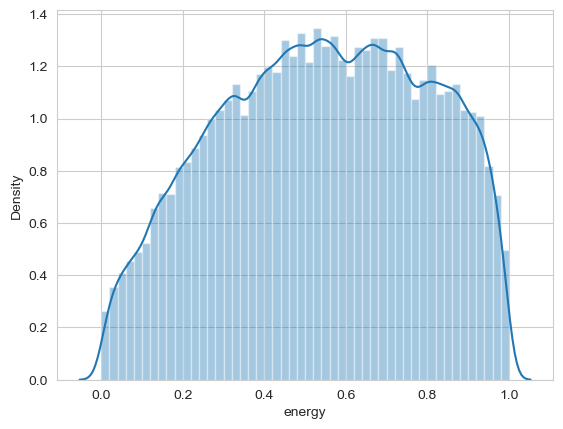

In [326]:
sns.distplot(df_tracks["energy"])

<AxesSubplot:xlabel='danceability', ylabel='Density'>

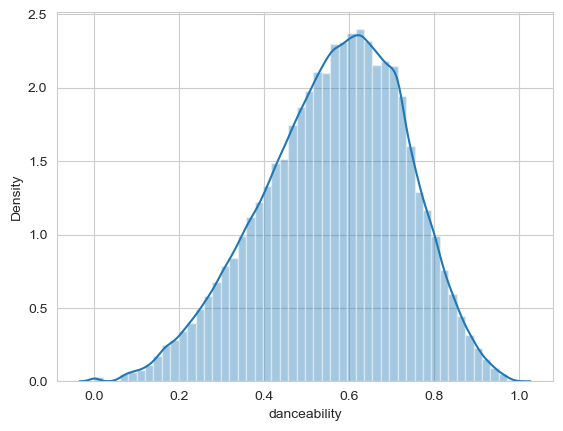

In [327]:
sns.distplot(df_tracks["danceability"])

<AxesSubplot:xlabel='acousticness', ylabel='Density'>

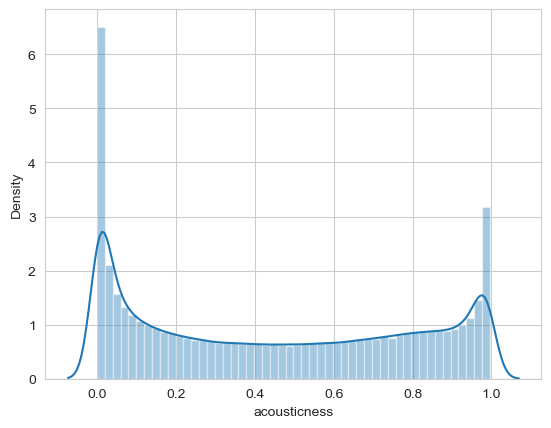

In [328]:
sns.distplot(df_tracks["acousticness"])

<AxesSubplot:xlabel='time_signature', ylabel='Density'>

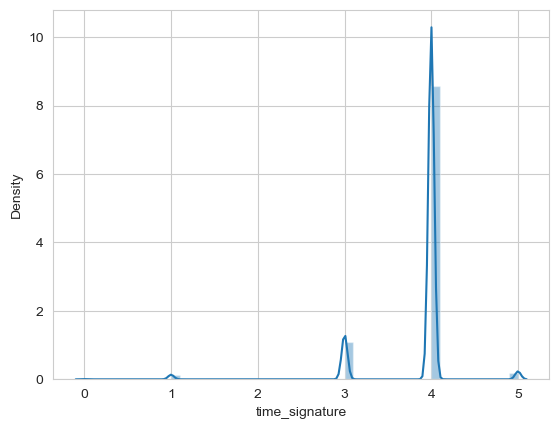

In [330]:
sns.distplot(df_tracks["time_signature"])

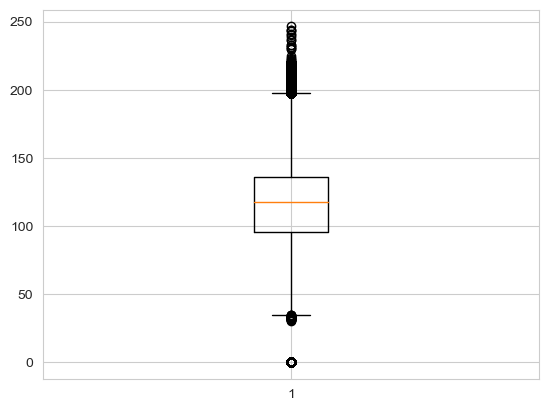

In [175]:
plt.boxplot(df_tracks['tempo'])
plt.show()

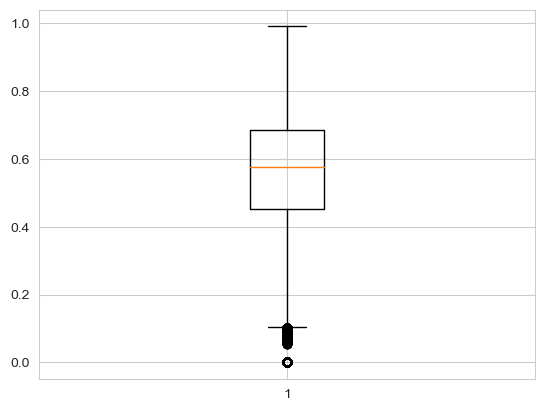

In [176]:
plt.boxplot(df_tracks['danceability'])
plt.show()

In [193]:
value_counts = df_tracks.popularity.value_counts(normalize=True)
value_counts = value_counts * 100
value_counts = value_counts.round(2).astype(str) + '%'
print(value_counts)

0      7.62%
35     2.08%
23     2.07%
1      2.05%
36     2.02%
       ...  
93      0.0%
95      0.0%
100     0.0%
99      0.0%
98      0.0%
Name: popularity, Length: 101, dtype: object


In [195]:
value_counts = df_tracks.valence.value_counts(normalize=True)
value_counts = value_counts * 100
value_counts = value_counts.round(2).astype(str) + '%'
print(value_counts)

0.96100    0.46%
0.96200    0.39%
0.96300    0.34%
0.96400    0.31%
0.96000    0.28%
           ...  
0.00704     0.0%
0.00831     0.0%
0.00382     0.0%
0.00789     0.0%
0.02030     0.0%
Name: valence, Length: 1805, dtype: object


In [ ]:
 Lenguaje fuerte;

2. Imágenes o referencias a violencia, abuso físico, mental;

3. Referencias o imágenes de comportamiento sexualizado;

4. Lenguaje o comportamiento racista, homofóbico, misógino u otro que pueda considerarse discriminatorio;

Vamos a añadir otro dataframe

In [349]:
df_genre = pd.read_csv(r'C:\Users\mareg\OneDrive\Escritorio\SPOTIFY CSV\SpotifyFeatures.csv')
df_genre.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [350]:
df_genre.columns

Index(['genre', 'artist_name', 'track_name', 'track_id', 'popularity',
       'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence'],
      dtype='object')

In [351]:
df_genre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

Cambiamos las unidades de duracion y creamos la columna

In [352]:
df_genre["duration"] = df_genre["duration_ms"].apply(lambda x: round(x/1000))
#df_tracks.drop("duration_ms", axis = 1, inplace = True)
df_genre.duration.head()

0     99
1    137
2    170
3    152
4     83
Name: duration, dtype: int64

In [470]:
df_genre.columns

Index(['genre', 'artist_name', 'name', 'id', 'popularity', 'acousticness',
       'danceability', 'duration_ms', 'energy', 'instrumentalness', 'key',
       'liveness', 'loudness', 'mode', 'speechiness', 'tempo',
       'time_signature', 'valence', 'duration'],
      dtype='object')

Text(0, 0.5, 'Genres')

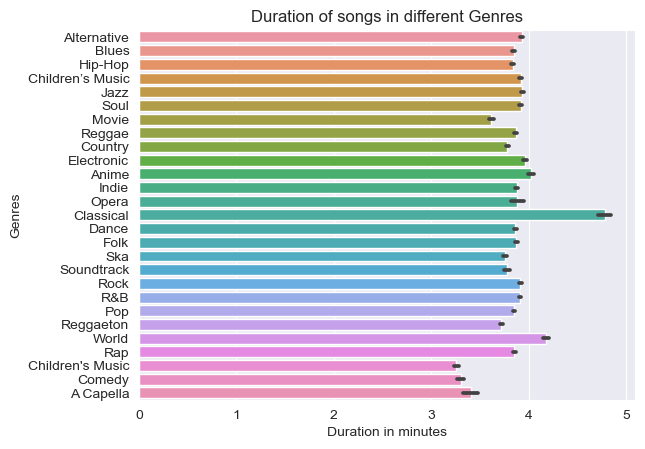

In [404]:
#plt.title('Duration of songs in different Genres')
#fig_dims= (15,10)
#fig,ax = plt.subplots(figsize= fig_dims)
#sns.color_palette('rocket', as_cmap=True)
sns.barplot(y='genre', x=df_final['duration']/60, data=df_final).set(title='Duration of songs in different Genres')
plt.xlabel('Duration in minutes')
plt.ylabel('Genres')

In [411]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1006297 entries, 0 to 1006296
Data columns (total 23 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   id                1006297 non-null  object        
 1   name              1006226 non-null  object        
 2   popularity        1006297 non-null  int64         
 3   explicit          1006297 non-null  int64         
 4   artists           1006297 non-null  object        
 5   id_artists        1006297 non-null  object        
 6   release_date      1006297 non-null  datetime64[ns]
 7   danceability      1006297 non-null  float64       
 8   energy            1006297 non-null  float64       
 9   key               1006297 non-null  int64         
 10  loudness          1006297 non-null  float64       
 11  mode              1006297 non-null  int64         
 12  speechiness       1006297 non-null  float64       
 13  acousticness      1006297 non-null  float6

In [409]:
sns.barplot(y='genre', x="decade", data=df_final).set(title='years of songs in different Genres')
plt.xlabel('Years')
plt.ylabel('Genres')

TypeError: Neither the `x` nor `y` variable appears to be numeric.

In [395]:
df_genre = df_genre.rename(columns={'track_id': 'id',"track_name": "name"})
df_genre.head()



,genre,artist_name,name,id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,duration
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814,99
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816,137
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368,170
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227,152
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390,83


In [371]:
df_genre.info() #232725
df_tracks.info() #586672

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   id                232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

In [439]:

df_final = pd.merge(df_tracks, df_genre[["id", "genre"]], on="id", how="left")
df_final.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,years,decade,genre
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,...,0.4510,0.674,0.7440,0.151,0.127,104.851,3,1922,1920s,NaN
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,...,0.9570,0.797,0.0000,0.148,0.655,102.009,1,1922,1920s,NaN
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,...,0.0512,0.994,0.0218,0.212,0.457,130.418,5,1922,1920s,NaN
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,...,0.0504,0.995,0.9180,0.104,0.397,169.980,3,1922,1920s,NaN
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922-01-01,0.402,0.1580,...,0.0390,0.989,0.1300,0.311,0.196,103.220,4,1922,1920s,NaN


In [398]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1006297 entries, 0 to 1006296
Data columns (total 23 columns):
 #   Column            Non-Null Count    Dtype         
---  ------            --------------    -----         
 0   id                1006297 non-null  object        
 1   name              1006226 non-null  object        
 2   popularity        1006297 non-null  int64         
 3   explicit          1006297 non-null  int64         
 4   artists           1006297 non-null  object        
 5   id_artists        1006297 non-null  object        
 6   release_date      1006297 non-null  datetime64[ns]
 7   danceability      1006297 non-null  float64       
 8   energy            1006297 non-null  float64       
 9   key               1006297 non-null  int64         
 10  loudness          1006297 non-null  float64       
 11  mode              1006297 non-null  int64         
 12  speechiness       1006297 non-null  float64       
 13  acousticness      1006297 non-null  float6

In [399]:
df_final.isnull().sum()

id                       0
name                    71
popularity               0
explicit                 0
artists                  0
id_artists               0
release_date             0
danceability             0
energy                   0
key                      0
loudness                 0
mode                     0
speechiness              0
acousticness             0
instrumentalness         0
liveness                 0
valence                  0
tempo                    0
time_signature           0
years                    0
duration                 0
decade                   0
genre               481028
dtype: int64

<AxesSubplot:>

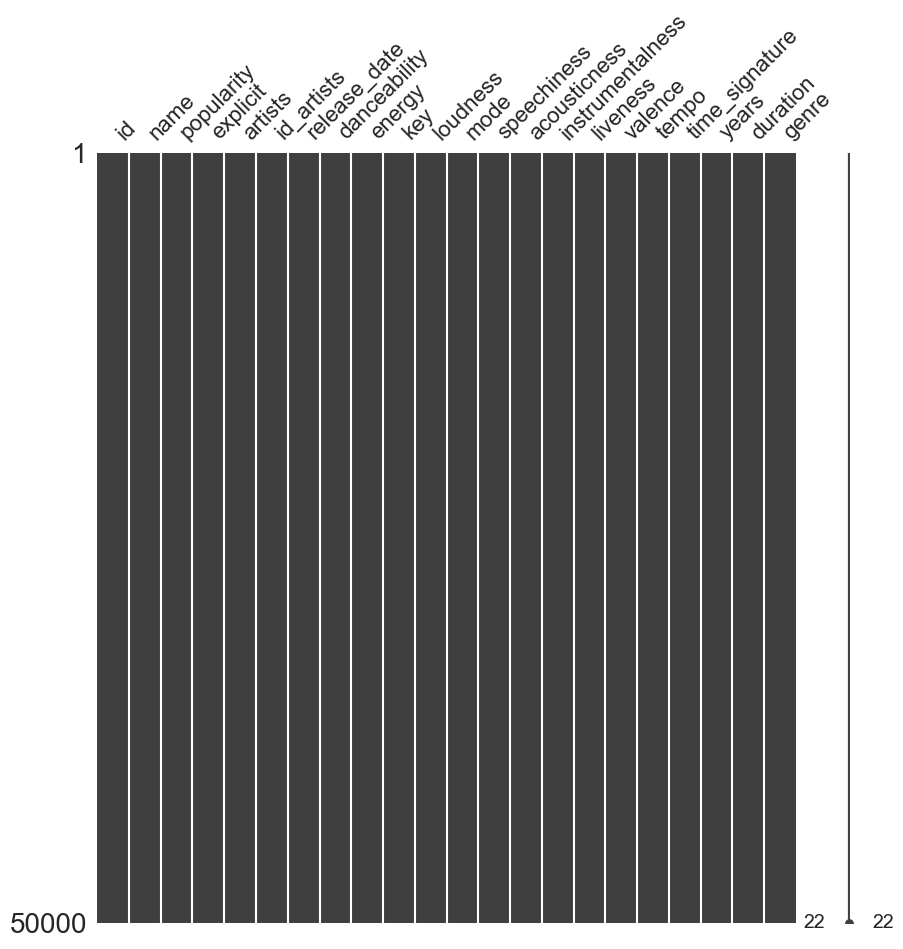

In [366]:
%matplotlib inline
msno.matrix(df_final.sample(50000), figsize=(10,10))

[Text(0.5, 1.0, 'Top 5 Genres by Popularity')]

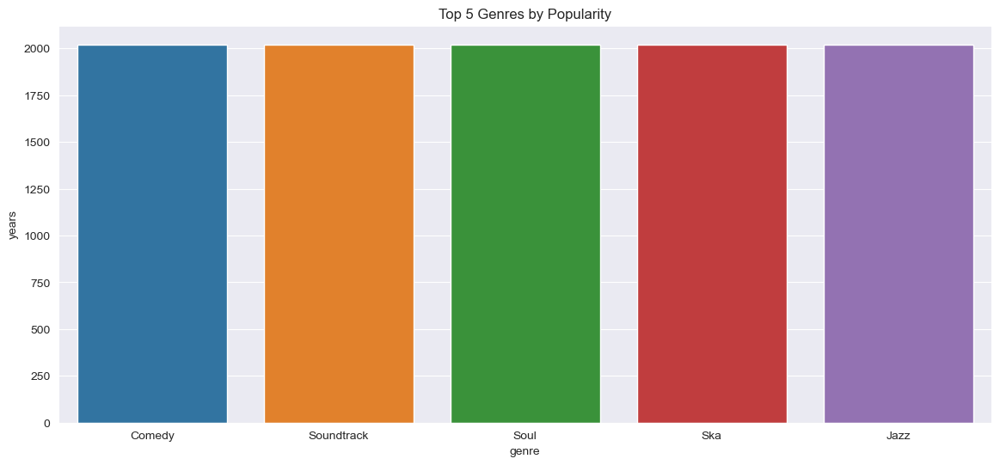

In [403]:
sns.set_style(style='darkgrid')
plt.figure(figsize=(14,6))
popular = df_final.sort_values('years', ascending=False).head(10)
sns.barplot(y = 'years', x = 'genre', data = popular).set(title='Top 5 Genres by Popularity')

falta que coincida el color de la leyenda y las lineas 

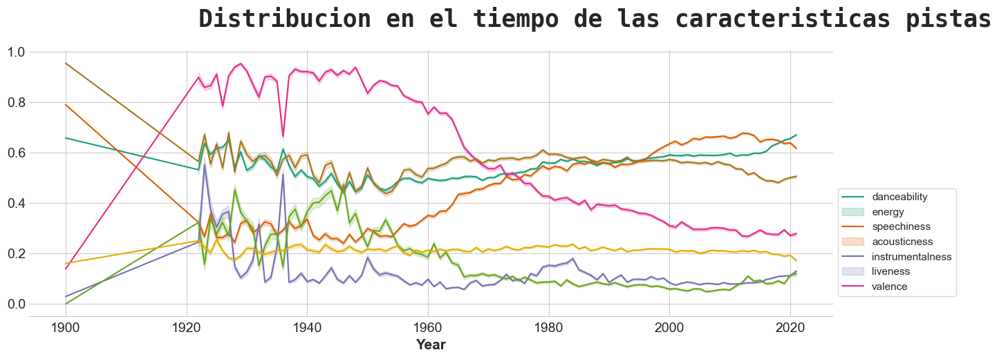

In [466]:
caract_audios = ['danceability', 'energy', 'speechiness', 'acousticness',
                  'instrumentalness', 'liveness', 'valence']

colormap = ['#1b9e77','#d95f02','#7570b3','#e7298a','#66a61e','#e6ab02','#a6761d']

audio_data = pd.DataFrame(df_final.groupby('years')[caract_audios].mean().sort_index()).reset_index()

fig = plt.figure(figsize=(15, 5), facecolor='white')
gs = fig.add_gridspec(1, 1)
ax = fig.add_subplot(gs[0, 0])

ax.text(1922, 1.1, 
         'Distribucion en el tiempo de las caracteristicas pistas', 
         fontsize=25, 
         fontweight='bold', 
         fontfamily='monospace'
        )

for feature, color in zip(caract_audios, colormap):
    sns.lineplot(data=df_final.iloc[1:, ], x='years', y=feature, color=color, ax=ax)
    
for direction in ['top','right','left']:
    ax.spines[direction].set_visible(False)
    
ax.tick_params(axis='y', labelsize=14)
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis = 'y', length=0)  
ax.set_xlabel('Year', fontsize=15, fontweight='bold')
ax.set_ylabel('')
#ax.legend(caract_audios, loc='upper right', fontsize=11)

ax.legend(caract_audios, bbox_to_anchor=(1.0, 0.5), loc='best', fontsize=11)


plt.show()


In [468]:
op_artists = df_final['artist'].value_counts().head(20).reset_index().rename(columns={'index':'artist', 'artist':'hits'})
sns.barplot(x=top_artists['hits'], y=top_artists['artist'], orient='h', palette='pastel').set_title('Top artists by number of hits')

KeyError: 'artist'

In [469]:
#top generos porcentaje 
f['genre_cat'] = df['genre'].apply(lambda x: x if x in df['genre'].value_counts(normalize=True).head(10) else 'other')
top_genre = df['genre_cat'].value_counts(normalize=True).reset_index().rename(columns={'index':'genre', 'genre_cat':'hits'}) 
sns.barplot(x=top_genre['hits'], y=top_genre['genre'], orient='h', palette='pastel').set_title('Top genres by percentage of hits')

NameError: name 'df' is not defined

In [ ]:
"C:\Users\mareg\Downloads\archive (5)\SpotifyFeatures.csv"